<a href="https://colab.research.google.com/github/naimaryan1/LunarMUnet/blob/main/Mars_Unet_Rocks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

SECTION 1- Martian Surface Semantic Segmentation Using U-Net

In [1]:
"""SECTION 1 -UNet based landescape image segmentation using Python 3.11 environment
based on open source data from titled "MarsData-V2 https://github.com/CVIR-Lab/MarsData"""
"""Imports"""
import copy
import os
import random
import shutil
import zipfile
from math import atan2, cos, sin, sqrt, pi, log
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from PIL import Image
from numpy import linalg as LA
from torch import optim
from torch.utils.data import DataLoader, random_split, Dataset
from torchvision import transforms
from tqdm import tqdm
from google.colab import drive
from scipy.spatial.distance import cdist
"""End imports"""

"""1) Mount your Google drive & navigate to correct path"""
drive.mount('/content/drive')

"""You should see expected structure"""
#Make your root dirs
#!mkdir -p ./drive/MyDrive/ECE551/unet || cd ./drive/MyDrive/drive/ECE551/unet
!ls ./drive/MyDrive/ECE551/unet/

"""source virtual env"""
!source ./drive/MyDrive/ECE551/unet/unet_venv/bin/activate

Mounted at /content/drive
artificial-lunar-rocky-landscape-dataset.zip  requirements.txt		    unet_venv
manual_pip_install.sh			      unet_lunar_my_checkpoint.pth


### SECTION 2 - First time data & data specific structure setup

In [5]:
"""Run these just once so that we can get the data and organize it in the correct structure"""
# !git clone https://github.com/CVIR-Lab/MarsData.git
# !mkdir -p /content/drive/MyDrive/ECE551/Mars
#!mkdir -p /content/drive/MyDrive/ECE551/Mars/unet
#!cp -avr /content/MarsData /content/drive/MyDrive/ECE551/Mars
#!ls -l /content/drive/MyDrive/ECE551/Mars/
#unzip the images
#!unzip /content/drive/MyDrive/ECE551/Mars/MarsData/img/test.zip  -d /content/drive/MyDrive/ECE551/Mars/MarsData/img/
#!unzip /content/drive/MyDrive/ECE551/Mars/MarsData/img/train.zip  -d /content/drive/MyDrive/ECE551/Mars/MarsData/img/
#!unzip /content/drive/MyDrive/ECE551/Mars/MarsData/img/val.zip  -d /content/drive/MyDrive/ECE551/Mars/MarsData/img/
#unzip the masks
#!unzip /content/drive/MyDrive/ECE551/Mars/MarsData/label/test.zip  -d /content/drive/MyDrive/ECE551/Mars/MarsData/mask/
#!unzip /content/drive/MyDrive/ECE551/Mars/MarsData/label/train.zip  -d /content/drive/MyDrive/ECE551/Mars/MarsData/mask/
#!unzip /content/drive/MyDrive/ECE551/Mars/MarsData/label/val.zip  -d /content/drive/MyDrive/ECE551/Mars/MarsData/mask/
# !mkdir -p /content/drive/MyDrive/ECE551/Mars/MarsData/coded/train
# !mkdir -p /content/drive/MyDrive/ECE551/Mars/MarsData/coded/test
# !mkdir -p /content/drive/MyDrive/ECE551/Mars/MarsData/coded/val
"""we only want there raw images & we donmt want there augmentations because we want control & do our own!"""
# !mkdir -p /content/drive/MyDrive/ECE551/Mars/MarsData/img_raw/train
# !mkdir -p /content/drive/MyDrive/ECE551/Mars/MarsData/img_raw/test
# !mkdir -p  /content/drive/MyDrive/ECE551/Mars/MarsData/img_raw/val
# !mkdir -p /content/drive/MyDrive/ECE551/Mars/MarsData/mask_raw/train
# !mkdir -p  /content/drive/MyDrive/ECE551/Mars/MarsData/mask_raw/test
# !mkdir -p  /content/drive/MyDrive/ECE551/Mars/MarsData/mask_raw/val
# !find /content/drive/MyDrive/ECE551/Mars/MarsData/mask/train -type f -iname '*raw.png' -exec cp {} /content/drive/MyDrive/ECE551/Mars/MarsData/mask_raw/train \;
# !find /content/drive/MyDrive/ECE551/Mars/MarsData/mask/test -type f -iname '*raw.png' -exec cp {} /content/drive/MyDrive/ECE551/Mars/MarsData/mask_raw/test \;
# !find /content/drive/MyDrive/ECE551/Mars/MarsData/mask/val -type f -iname '*raw.png' -exec cp {} /content/drive/MyDrive/ECE551/Mars/MarsData/mask_raw/val \;

'we only want there raw images & we donmt want there augmentations because we want control & do our own!'

### SECTION 3 - Initialize the paths

In [2]:
"""Initialize the paths. Change MARS_ROOT to your root folder. Use the ./img_raw & mask_raw/ paths"""
MARS_ROOT = "drive/MyDrive/ECE551/Mars" #This is you top level project dir
MARS_WORKING_DIR = MARS_ROOT+ "/unet" #This model dir
MARS_DATA_DIR = MARS_ROOT + "/MarsData" #Top level data dir
MARS_TRAIN_DIR = MARS_DATA_DIR + "/img_raw/train/" #training data
MARS_TRAIN_MASK_DIR = MARS_DATA_DIR + "/mask_raw/train/" #training masks
MARS_TRAIN_CODED_DIR = MARS_DATA_DIR + "/coded/train/" #training coded to 0-N classes
MARS_TEST_DIR = MARS_DATA_DIR + "/img_raw/test/" #training data
MARS_TEST_MASK_DIR = MARS_DATA_DIR + "/mask_raw/test/" #training masks
MARS_TEST_CODED_DIR = MARS_DATA_DIR + "/coded/test/" #test coded to 0-N classes
MARS_VAL_DIR = MARS_DATA_DIR + "/img_raw/val/" #training data
MARS_VAL_MASK_DIR = MARS_DATA_DIR + "/mask_raw/val/" #training masks
MARS_VAL_CODED_DIR = MARS_DATA_DIR + "/coded/val/" #val coded to 0-N classes
mars_model_pth = MARS_WORKING_DIR+"/unet_mars_my_checkpoint.pth" #unet - model will be in this .pth file

#color map is based on color classes as indicated in ./masks or  mask_raw/
mars_color_class_map = {
    (0, 0, 0): 0,       # Ground Surface (Class 1)
    (255, 255, 0): 255     # Rock (Class 2)
}
IMG_HEIGHT = 256
IMG_WIDTH = 256


### SECTION 4- Visualize Raw Dataset

Displaying raw synthetics images original render & mask paths:


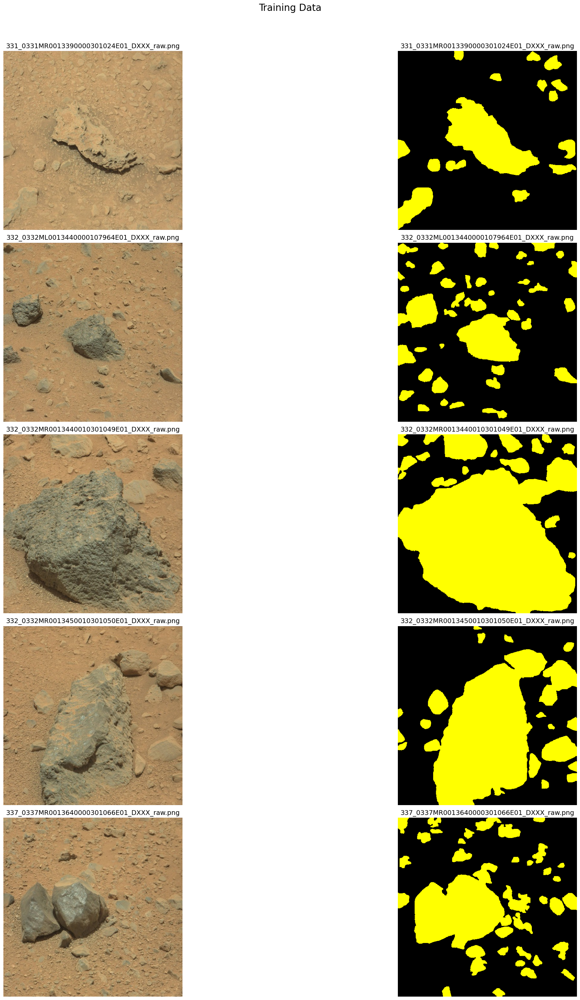

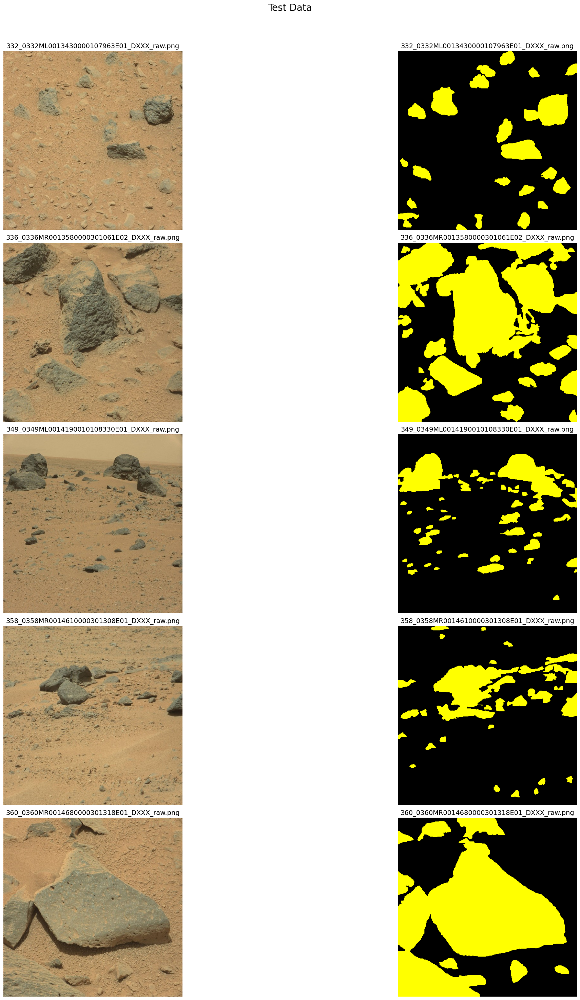

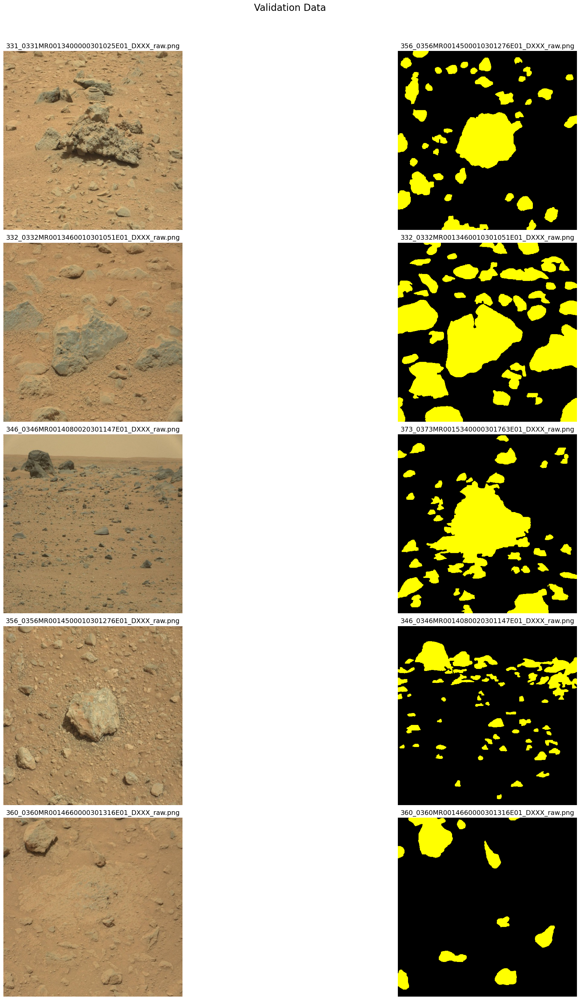

In [3]:
"""MARTIAN - vislualize the Mars Dataset"""
""" Visualize the synthetic raw data"""

#Preview raw training data & corresponding masks
print("Displaying raw synthetics images original render & mask paths:")
IMG_DIR = MARS_TRAIN_DIR
MASKS_DIR = MARS_TRAIN_MASK_DIR

images = sorted([f for f in os.listdir(IMG_DIR) if os.path.isfile(os.path.join(IMG_DIR, f))])
masks = sorted([f for f in os.listdir(MASKS_DIR ) if os.path.isfile(os.path.join(MASKS_DIR  , f))])

images = images[:5]
masks = masks[:5]

n = len(images)
fig, axs = plt.subplots(nrows=n, ncols=2, figsize=(30, 30))
fig.suptitle("Training Data", fontsize=20)
axs[0, 0].set_title("Images", fontsize=18)
axs[0, 1].set_title("Masks", fontsize=18)

for i, (img_file, mask_file) in enumerate(zip(images, masks)):
    img = cv2.imread(IMG_DIR + img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(img_file, fontsize=14)
    axs[i, 0].axis('off')
    mask = cv2.imread(MASKS_DIR + mask_file)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    axs[i, 1].imshow(mask)
    axs[i, 1].set_title(mask_file, fontsize=14)
    axs[i, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#Test data
IMG_DIR = MARS_TEST_DIR
MASKS_DIR = MARS_TEST_MASK_DIR
images = sorted([f for f in os.listdir(IMG_DIR) if os.path.isfile(os.path.join(IMG_DIR, f))])
masks = sorted([f for f in os.listdir(MASKS_DIR ) if os.path.isfile(os.path.join(MASKS_DIR  , f))])

images = images[:5]
masks = masks[:5]

n = len(images)
fig, axs = plt.subplots(nrows=n, ncols=2, figsize=(30, 30))
fig.suptitle("Test Data", fontsize=20)
axs[0, 0].set_title("Images", fontsize=18)
axs[0, 1].set_title("Masks", fontsize=18)

for i, (img_file, mask_file) in enumerate(zip(images, masks)):
    img = cv2.imread(IMG_DIR + img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(img_file, fontsize=14)
    axs[i, 0].axis('off')
    mask = cv2.imread(MASKS_DIR + mask_file)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    axs[i, 1].imshow(mask)
    axs[i, 1].set_title(mask_file, fontsize=14)
    axs[i, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

#Validation data
IMG_DIR = MARS_VAL_DIR
MASKS_DIR = MARS_VAL_MASK_DIR
images = [f for f in os.listdir(IMG_DIR) if os.path.isfile(os.path.join(IMG_DIR, f))]
masks = [f for f in os.listdir(MASKS_DIR ) if os.path.isfile(os.path.join(MASKS_DIR  , f))]

images = images[:5]
masks= masks[:5]

n = len(images)
fig, axs = plt.subplots(nrows=n, ncols=2, figsize=(30, 30))
fig.suptitle("Validation Data", fontsize=20)
axs[0, 0].set_title("Images", fontsize=18)
axs[0, 1].set_title("Masks", fontsize=18)

for i, (img_file, mask_file) in enumerate(zip(images, masks)):
    img = cv2.imread(IMG_DIR + img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) #opencv bgr -> rgb
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(img_file, fontsize=14)
    axs[i, 0].axis('off')
    mask = cv2.imread(MASKS_DIR + mask_file)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    axs[i, 1].imshow(mask)
    axs[i, 1].set_title(mask_file, fontsize=14)
    axs[i, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



### SECTION 5 - Visualization Functions

In [4]:

"""Meant to display img OR mask pair that was provided"""
def display_images_in_grid(images, rows=10, cols=5, column_names=None):
    """
    Displays images in a grid with column names spaced exactly above each column.

    Parameters:
    - images (list): List of image arrays.
    - rows (int): Number of rows in the grid.
    - cols (int): Number of columns in the grid.
    - column_names (list of str, optional): List of column names to be displayed above each column.
    """
    fig, axs = plt.subplots(rows + 1, cols, figsize=(cols * 2, (rows + 0.5) * 2))  # Extra row for column names
    axs = axs.flatten()

    # Add column headers (if provided)
    if column_names:
        for col in range(min(cols, len(column_names))):
            axs[col].text(0.5, 1.2, column_names[col], fontsize=12, fontweight='bold', ha='center', va='bottom', transform=axs[col].transAxes)
        for col in range(cols):  # Remove axis for header row
            axs[col].axis('off')

    # Display images in the grid
    for idx in range(rows * cols):
        # Stop if there are no more images to display
        if idx >= len(images):
            break

        image = images[idx]

        # Convert colored images from BGR to RGB
        if len(image.shape) == 3:
            # First conversion using cv (assumed to be cv2)
            image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        else:
            image_rgb = image

        # Additional conversion using cv2 (ensure consistency in library usage)
        image_rgb = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)

        # Determine colormap: use 'gray' if the image is grayscale, else default
        colormap = 'gray' if len(image.shape) == 2 else None

        # Display the image at the appropriate grid position
        ax_index = idx + cols
        axs[ax_index].imshow(image_rgb, cmap=colormap)
        axs[ax_index].axis('off')

        # Turn off extra subplots if images are fewer than grid slots
        # The inner loop should iterate using a new variable 'j'
        for j in range(idx + cols + 1, (rows + 1) * cols):
            axs[j].axis('off')

    plt.tight_layout()
    plt.show()

def display_images_in_grid_using_codes(images, color_class_map, rows=10, cols=5, column_names=None):
    """
    Displays a grid of images, converting grayscale class-coded masks back to RGB using color_class_map.

    Parameters:
    - images (list): List of image arrays.
    - color_class_map (dict): Mapping from RGB tuples to class codes.
    - rows (int): Number of rows in the grid.
    - cols (int): Number of columns in the grid.
    - column_names (list of str, optional): Column headers for display.
    """
    fig, axs = plt.subplots(rows + 1, cols, figsize=(cols * 2, (rows + 0.5) * 2))
    axs = axs.flatten()

    # Invert color_class_map to map from class code → RGB tuple
    class_to_color = {v: k for k, v in color_class_map.items()}

    # Add column headers if provided
    if column_names:
        for col in range(min(cols, len(column_names))):
            axs[col].text(0.5, 1.2, column_names[col], fontsize=12, fontweight='bold',
                          ha='center', va='bottom', transform=axs[col].transAxes)
        for col in range(cols):
            axs[col].axis('off')

    for idx in range(rows * cols):
        if idx >= len(images):
            break

        img = images[idx]

        # Convert grayscale class-coded mask to RGB using color_class_map
        if len(img.shape) == 2 or (len(img.shape) == 3 and img.shape[2] == 1):
            img_2d = img.squeeze()  # ensure shape is (H, W)
            height, width = img_2d.shape[:2]
            color_img = np.zeros((height, width, 3), dtype=np.uint8)
            for class_id, rgb in class_to_color.items():
                mask = (img_2d == class_id)
                color_img[mask] = rgb  # Assign RGB directly, do NOT convert
            img_to_show = color_img  # Already in RGB, no need to convert
        else:
            # If image was read with OpenCV and is BGR, convert to RGB
            img_to_show = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        ax_index = idx + cols
        axs[ax_index].imshow(img_to_show)
        axs[ax_index].axis('off')

    # Hide remaining unused subplots
    for j in range(len(images) + cols, (rows + 1) * cols):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()


def filter_white_blobs_by_area(
    gray_image: np.ndarray,
    min_area: int = 500,
    max_area: int = None,
    return_rgb: bool = True
) -> np.ndarray:
    """
    Filters and returns only continuous white blobs from a grayscale image,
    based on area constraints.

    Args:
        gray_image (np.ndarray): Grayscale image (uint8) with white blobs.
        min_area (int): Minimum area of blobs to keep.
        max_area (int or None): Maximum area of blobs to keep. If None, no max filter.
        return_rgb (bool): If True, returns RGB image. If False, returns grayscale mask.

    Returns:
        np.ndarray: Image with filtered white blobs (RGB or grayscale).
    """

    # Step 1: Threshold white regions
    lower_white = np.array(240, dtype=np.uint8)
    upper_white = np.array(255, dtype=np.uint8)
    white_mask = cv2.inRange(gray_image, lower_white, upper_white)
    only_white = cv2.bitwise_and(gray_image, gray_image, mask=white_mask)

    # Step 2: Find contours
    contours, _ = cv2.findContours(only_white, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Step 3: Create blank canvas to draw filtered blobs
    filtered = np.zeros_like(gray_image)

    # Step 4: Filter contours by area and draw
    for contour in contours:
        area = cv2.contourArea(contour)
        if area >= min_area and (max_area is None or area <= max_area):
            cv2.drawContours(filtered, [contour], -1, color=255, thickness=cv2.FILLED)

    # Step 5: Convert to RGB if needed
    if return_rgb:
        return cv2.cvtColor(filtered, cv2.COLOR_GRAY2RGB)
    else:
        return filtered

### SECTION 6 - Martian Dataloaders

In [5]:
import os
import cv2
import torch
import numpy as np
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as transforms


class MartianRocksDatasetFromDrive(Dataset):
    def __init__(self, train_path, masks_path, limit=None, INPUT_HEIGHT=512, INPUT_WIDTH=512):
        self.INPUT_HEIGHT = INPUT_HEIGHT
        self.INPUT_WIDTH = INPUT_WIDTH

        self.images = sorted([os.path.join(train_path, i) for i in os.listdir(train_path)])[:limit]
        self.masks = sorted([os.path.join(masks_path, i) for i in os.listdir(masks_path)])[:limit]
        self.limit = limit if limit is not None else len(self.images)

        self.image_transform = transforms.Compose([
            transforms.Resize((self.INPUT_HEIGHT, self.INPUT_WIDTH)),
            transforms.ToTensor()
        ])

        self.mask_transform = transforms.Compose([
            transforms.Resize((self.INPUT_HEIGHT, self.INPUT_WIDTH)),
            transforms.ToTensor()  # ensures shape [1, H, W]
        ])

    def __getitem__(self, index):
        # --- Image ---
        image = cv2.imread(self.images[index])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(image)
        img_tensor = self.image_transform(image)

        # --- Mask ---
        mask = cv2.imread(self.masks[index], cv2.IMREAD_UNCHANGED)  # Load with original channels

        # Fix shape issues
        mask = np.squeeze(mask)

        if len(mask.shape) == 3 and mask.shape[2] == 3:
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

        if len(mask.shape) != 2:
            raise ValueError(f"Mask at index {index} is not 2D after squeezing: shape={mask.shape}")

        mask = mask.astype("uint8")
        mask = Image.fromarray(mask)
        mask_tensor = self.mask_transform(mask)

        return img_tensor, mask_tensor

    def __len__(self):
        return self.limit


class MartianRocksDatasetFromArray(Dataset):
    def __init__(self, imgs_array, masks_array, limit=None, INPUT_HEIGHT=512, INPUT_WIDTH=512):
        self.limit = limit if limit else len(imgs_array)
        self.images = imgs_array[:self.limit]
        self.masks = masks_array[:self.limit]

        self.INPUT_HEIGHT = INPUT_HEIGHT
        self.INPUT_WIDTH = INPUT_WIDTH

        self.image_transform = transforms.Compose([
            transforms.Resize((self.INPUT_HEIGHT, self.INPUT_WIDTH)),
            transforms.ToTensor()
        ])

        self.mask_transform = transforms.Compose([
            transforms.Resize((self.INPUT_HEIGHT, self.INPUT_WIDTH)),
            transforms.ToTensor()  # ensures shape [1, H, W]
        ])

    def __getitem__(self, index):
        # --- Image ---
        image = self.images[index]
        image = Image.fromarray(image)
        img_tensor = self.image_transform(image)

        # --- Mask ---
        mask = self.masks[index]
        mask = np.squeeze(mask)

        if len(mask.shape) == 3 and mask.shape[2] == 3:
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

        if len(mask.shape) != 2:
            raise ValueError(f"Mask at index {index} is not 2D after squeezing: shape={mask.shape}")

        mask = mask.astype("uint8")
        mask = Image.fromarray(mask)
        mask_tensor = self.mask_transform(mask)

        return img_tensor, mask_tensor

    def __len__(self):
        return self.limit


### SECTION 7 - Visualize Raw Image, Masks, & Histogram

<ipython-input-6-d9c1514d76f8>:73: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


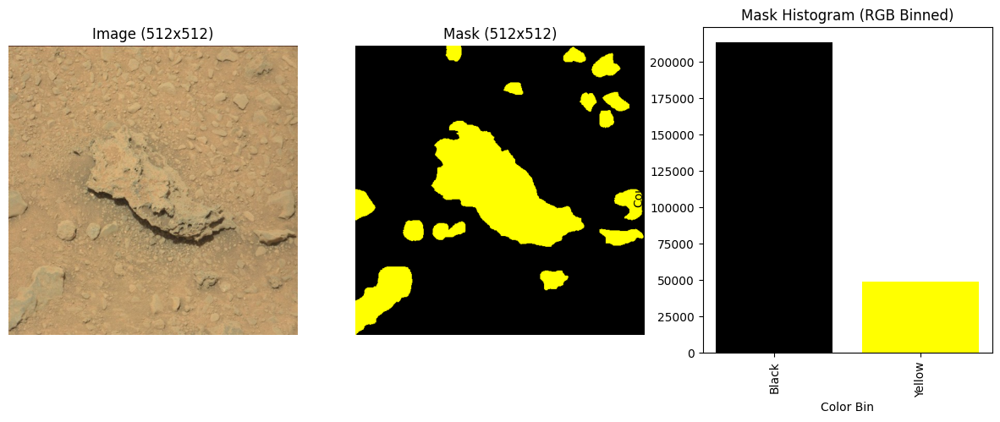

<ipython-input-6-d9c1514d76f8>:73: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


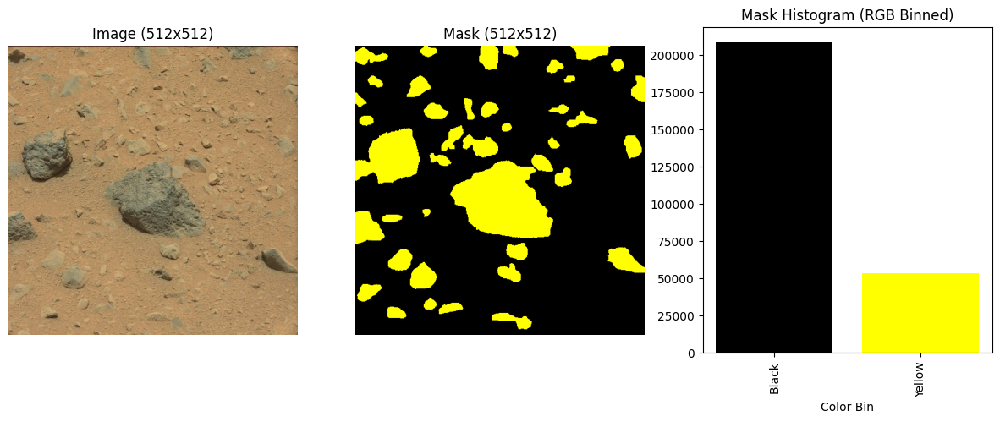

<ipython-input-6-d9c1514d76f8>:73: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


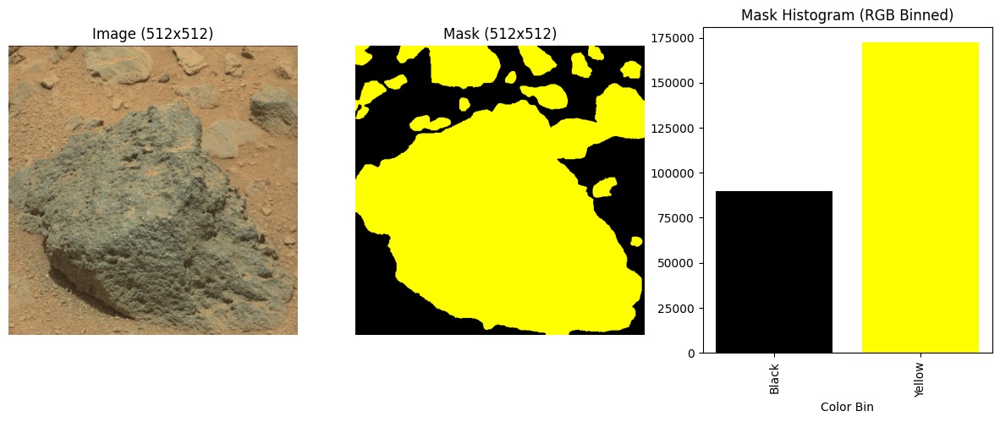

<ipython-input-6-d9c1514d76f8>:73: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


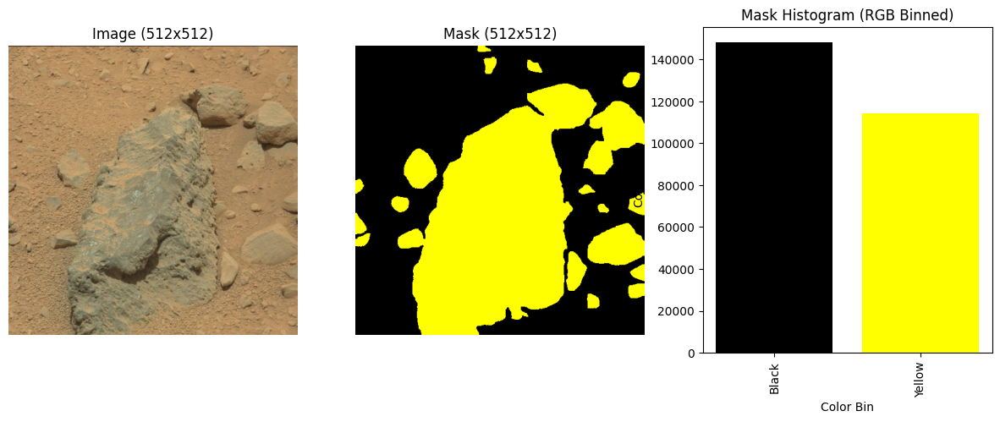

<ipython-input-6-d9c1514d76f8>:73: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


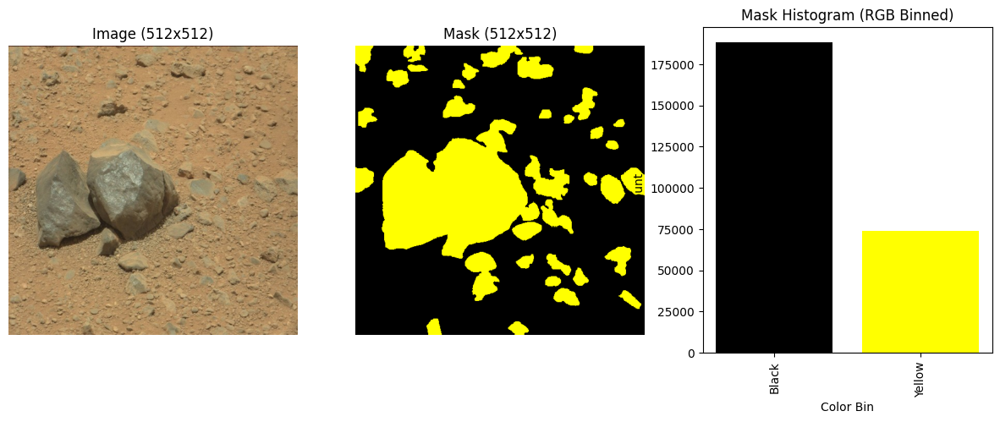

In [6]:
"""Check the RGB histogram again. There should only be 2 colors corresponding to 2 classes"""
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from sklearn.neighbors import KDTree  # Fast nearest neighbor search

# Define RGB bins for closest matching
RGB_BINS = {
    "Black": (0, 0, 0), "White": (255, 255, 255), "Red": (255, 0, 0), "Lime": (0, 255, 0),
    "Blue": (0, 0, 255), "Yellow": (255, 255, 0), "Cyan": (0, 255, 255), "Magenta": (255, 0, 255),
    "Silver": (192, 192, 192), "Gray": (128, 128, 128), "Maroon": (128, 0, 0), "Olive": (128, 128, 0),
    "Green": (0, 128, 0), "Purple": (128, 0, 128), "Teal": (0, 128, 128), "Navy": (0, 0, 128)
}

# Convert RGB bins to a NumPy array for efficient KDTree search
bin_colors = np.array(list(RGB_BINS.values()))
bin_names = np.array(list(RGB_BINS.keys()))  # Convert to NumPy array for fast indexing

# Create KDTree for fast nearest color lookup
kd_tree = KDTree(bin_colors)

def closest_color_map(mask_rgb):
    """Finds the closest color for all pixels in an image mask using vectorized KDTree."""

    # Reshape image to (num_pixels, 3) for vectorized processing
    pixels = mask_rgb.reshape(-1, 3)

    # Query the KDTree for nearest neighbors (vectorized, no loop!)
    _, indices = kd_tree.query(pixels, k=1)

    # Map indices back to corresponding color names
    mapped_colors = bin_names[indices.flatten()].reshape(mask_rgb.shape[:2])  # Reshape back

    return mapped_colors

def show_samples(dataset,masks, N=5):
    """Displays N samples from the dataset along with their dimensions and mask histograms."""
    counter = 0
    for image, mask in zip(dataset,masks):

        # Get dimensions
        image =  cv2.imread(image)
        mask = cv2.imread(mask)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #opencv -> bgr to rgb
        mask= cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)  #opencv -> bgr to rgb
        img_h, img_w, channels = image.shape
        mask_h, mask_w, channels = mask.shape

        # Fast color mapping using KDTree
        mapped_colors = closest_color_map(mask)

        # Count unique color bins
        unique_bins, counts = np.unique(mapped_colors, return_counts=True)

        # Plot images and histograms
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(image)
        ax[0].set_title(f"Image ({img_w}x{img_h})")
        ax[0].axis("off")

        ax[1].imshow(mask)
        ax[1].set_title(f"Mask ({mask_w}x{mask_h})")
        ax[1].axis("off")

        # Convert bin colors for plotting
        bar_colors = [np.array(RGB_BINS[color]) / 255 for color in unique_bins]

        ax[2].bar(unique_bins, counts, color=bar_colors)
        ax[2].set_title("Mask Histogram (RGB Binned)")
        ax[2].set_xlabel("Color Bin")
        ax[2].set_ylabel("Count")
        ax[2].set_xticklabels(unique_bins, rotation=90)

        plt.show()
        counter  = counter + 1
        if counter >= 5:
          break

IMG_DIR = MARS_TRAIN_DIR
MASKS_DIR = MARS_TRAIN_MASK_DIR


images = [os.path.join(IMG_DIR, f) for f in os.listdir(IMG_DIR) if os.path.isfile(os.path.join(IMG_DIR, f))]
masks = [os.path.join(MASKS_DIR, f) for f in os.listdir(MASKS_DIR) if os.path.isfile(os.path.join(MASKS_DIR, f))]

# Sort both lists using the same key
image_files_sorted = sorted(images)
mask_files_sorted = sorted(masks)

images = image_files_sorted[:20]
masks  = mask_files_sorted[:20]

# Example usage:
show_samples(images,masks, N=20)

### SECTION 7 - Codify the masks to 0 to 255 labels

In [ ]:
"""**WARNING: ONLY RUN this procedure once. It creates a single-channel (0–255)
mask from RGB values and saves converted files to your path for subsequent use.."""
#WARNING ONLY RUN ONCE.
#WARNING ONLY RUN ONCE.
import os
import cv2
import numpy as np

def codify_masks(input_dir, output_dir, color_class_map, limit=None):
    """
    Converts RGB mask images to class-coded images based on a color-to-class map.

    Args:
        input_dir (str): Directory containing input RGB mask images.
        output_dir (str): Directory to save the class-coded output images.
        color_class_map (dict): Dictionary mapping RGB tuples to class codes.
        limit (int or None): Maximum number of images to process. If None, process all.

    Example:
        color_class_map = {
            (0, 0, 0): 0,
            (255, 255, 0): 1
        }
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # List all image files in the input directory
    image_files = [
        f for f in os.listdir(input_dir)
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ]

    if limit is not None:
        image_files = image_files[:limit]

    for filename in image_files:
        input_path = os.path.join(input_dir, filename)
        output_path = os.path.join(output_dir, filename)

        # Read the image in BGR format
        image_bgr = cv2.imread(input_path, cv2.IMREAD_COLOR)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        # Prepare an empty class-coded mask
        class_mask = np.zeros((image_rgb.shape[0], image_rgb.shape[1]), dtype=np.uint8)

        for color, class_code in color_class_map.items():
            mask = np.all(image_rgb == color, axis=-1)
            class_mask[mask] = class_code

        cv2.imwrite(output_path,class_mask)

    print(f"Processed {len(image_files)} image(s).")

#call for train, val, test
mars_color_class_map = {
    (0, 0, 0): 0,       # Ground Surface (Class 1)
    (255, 255, 0): 255     # Rock (Class 2)
}

#codify for train
MARS_TRAIN_MASK_DIR = MARS_DATA_DIR + "/mask_raw/train/" #training masks
MARS_TRAIN_CODED_DIR = MARS_DATA_DIR + "/coded/train/" #training coded to 0-N classes
codify_masks(MARS_TRAIN_MASK_DIR, MARS_TRAIN_CODED_DIR, mars_color_class_map)
#codify val
MARS_VAL_MASK_DIR = MARS_DATA_DIR + "/mask_raw/val/" #training masks
MARS_VAL_CODED_DIR = MARS_DATA_DIR + "/coded/val/" #val coded to 0-N classes
codify_masks(MARS_VAL_MASK_DIR,MARS_VAL_CODED_DIR , mars_color_class_map)
#codify test
MARS_TEST_MASK_DIR = MARS_DATA_DIR + "/mask_raw/test/" #test masks
MARS_TEST_CODED_DIR = MARS_DATA_DIR + "/coded/test/" #test coded to 0-N classes
codify_masks(MARS_TEST_MASK_DIR, MARS_TEST_CODED_DIR , mars_color_class_map)


Processed 10 image(s).
Processed 10 image(s).
Processed 10 image(s).


### SECTION 8 - Data Augmentation

Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/331_0331MR0013390000301024E01_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/332_0332ML0013440000107964E01_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/332_0332MR0013440010301049E01_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/332_0332MR0013450010301050E01_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/337_0337MR0013640000301066E01_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/345_0345MR1401000000E1_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/346_0346MR0014080010301146E01_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/MarsData/img_raw/train/349_0349MR0014200000301164E01_DXXX_raw.png, Augmentations: 18
Processed drive/MyDrive/ECE551/Mars/Mar

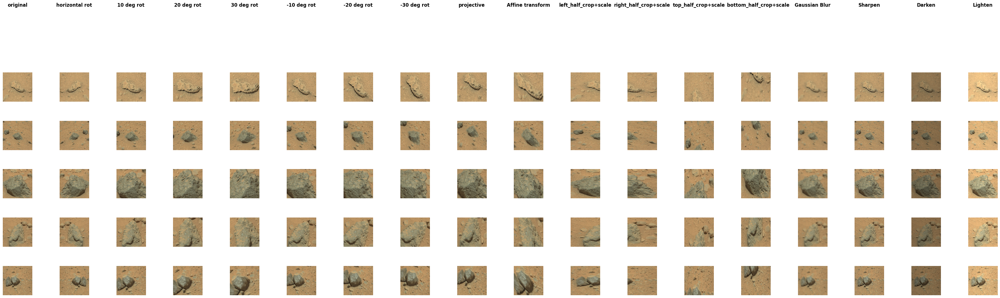

Displaying corresponding coded masks:


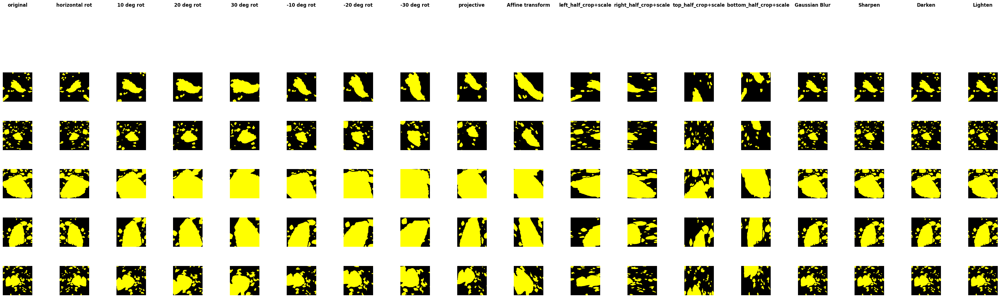

Actual image vs masks in single
Image batch shape: torch.Size([4, 3, 256, 256])
Mask batch shape: torch.Size([4, 1, 256, 256])


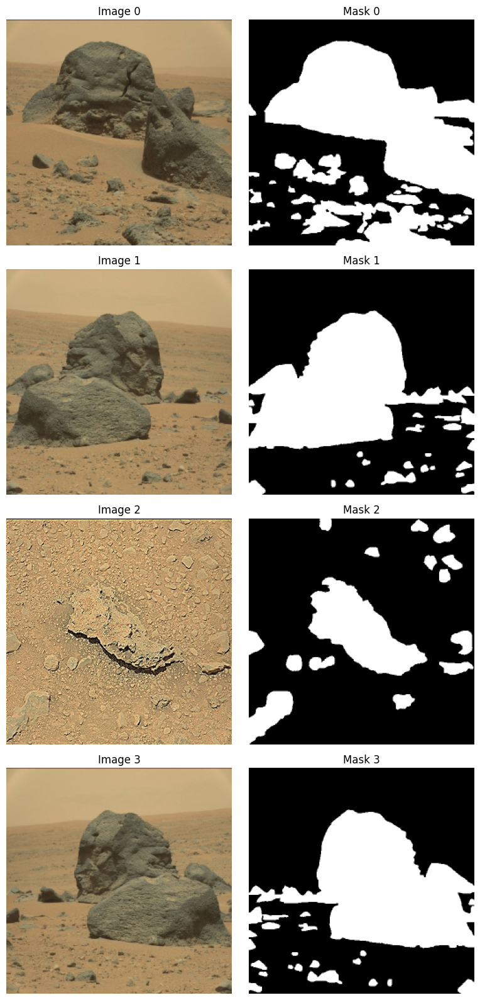

Train size: 180
Test size: 10
Val size: 10


152046

In [7]:
"""Functions related to augmentation"""
import gc
import cv2 as cv
import numpy as np
from PIL import Image
from multiprocessing import Pool
import math
from scipy.spatial import cKDTree
import numpy as np
import cv2
from scipy.spatial import cKDTree  # KDTree for fast nearest-neighbor search
import torch
from torchvision.transforms import v2
from natsort import natsorted
import os

# Augmentation functions for mars
def mars_augmentation_process_x(x):
    try:

        x = np.array(x, dtype=np.uint8)  # Ensure it is a NumPy array with the correct data type
        x = cv2.resize(x, (IMG_HEIGHT,IMG_WIDTH), interpolation=cv2.INTER_AREA) #resize
        #x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
        (h,w) = x.shape[:2] #width , height
        center = (w // 2, h // 2)  # Rotate around the image center
        if len(x.shape) == 2:  # If the image is grayscale, convert to 3 channels
            x = cv.cvtColor(x, cv.COLOR_GRAY2RGB)

        aug_X = []
        aug_X.append(x)  # Original image
        aug_X.append(cv.flip(x, 1))  # Horizontal flip
        #START -  counter clockwise rotations
        # start - rotate 10 degrees counter clock wise
        angle_deg = 10  # Counterclockwise rotation
        scale_10_degree_rotation = 1.30
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        # end - rotate 10 degrees counter clock wise
        #start - rotate 20
        angle_deg = 20  # Counterclockwise rotation
        scale_20_degree_rotation = 1.55
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        # #end - rotate 20
        #start  - rotate 30
        angle_deg = 30  # Counterclockwise rotation
        scale_30_degree_rotation = 1.80
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_30_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        #end - rotate  30
        #END -  counter clockwise rotations
        #START -  counterwise  rotations
        #start - 10 degrees
        angle_deg = -10  # clockwise rotation
        scale_10_degree_rotation = 1.30
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        #nd - 10 degrees
        #start - 20 degrees
        angle_deg = -20  # clockwise rotation
        scale_20_degree_rotation = 1.55
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        # #end - 20 degrees
        #start - 30 degrees
        angle_deg = -30  # clockwise rotation
        scale_30_degree_rotation = 1.80
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        #end - 30 degrees
        #END -  counterwise  rotations
        #Start - projective transformations
        #projected to trapezoid
        num_cols = w
        num_rows = h
        upper_horizontal_shirk_factor = 0.2 #how much to shrink the top from both sides
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1], [num_cols,num_rows-1]])
        dst_points = np.float32([[int(num_cols*upper_horizontal_shirk_factor),0], [num_cols-int(num_cols*upper_horizontal_shirk_factor),0], [0,num_rows-1], [num_cols,num_rows-1]])
        projective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
        img_projected = cv2.warpPerspective(x, projective_matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,1.55) #top was shrunck which adds black areas that need to be removed
        img_projected_scaled = cv2.warpAffine(img_projected, rotation_matrix, (w, h))
        aug_X.append(img_projected_scaled)
        #end - projective
        #Start - affine transformations
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1]])
        dst_points = np.float32([[0,0], [int(0.6*(num_cols-1)),0], [int(0.4*(num_cols-1)),num_rows-1]])
        matrix = cv2.getAffineTransform(src_points, dst_points)
        img_afftran = cv2.warpAffine(x, matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,2.4) #top was shrunck which adds black areas that need to be removed
        img_afftran = cv2.warpAffine(img_afftran, rotation_matrix, (w, h))
        aug_X.append(img_afftran)
        #end - affine transformations
        #left half crop -start
        #Crop and keep the first vertical half (left half)
        cropped_img = x[:, :w // 2] #w= image width
        left_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_X.append(left_half)
        #left half crop - end
        #right half crop - start
        cropped_img = x[:, w // 2:]  #w= image width
        right_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_X.append(right_half)
        #right half crop - end
        #top half - start
        cropped_img = x[:h // 2, :] # h = height
        top_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_X.append(top_half)
        #top half - end
        #bottom half - start
        cropped_img = x[h // 2:, :] # h = height
        top_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_X.append(top_half)
        #bottom half  - end
        aug_X.append(cv.GaussianBlur(x, (15, 15), 0))  # Gaussian blur
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])  # Sharpen kernel
        aug_X.append(cv.filter2D(x, -1, kernel))  # Sharpen
        #darken by 25% - more than 25% was creating very dark images
        darker_img = np.clip(x* 0.75, 0, 255).astype(np.uint8)
        aug_X.append(darker_img)
        #lighten by 25%
        lighter_img = np.clip(x* 1.25, 0, 255).astype(np.uint8)
        aug_X.append(lighter_img)
        # Ensure the output stays in uint8 format
        for i in range(len(aug_X)):
          aug_X[i] = np.clip(aug_X[i], 0, 255).astype(np.uint8)
        return aug_X
    except Exception as e:
        print(f"An error occurred in augmentation_process_x: {e}")
        return []

"""Augmentation for masks"""
def mars_augmentation_process_y(y):
    try:

        y = np.array(y, dtype=np.uint8)  # Ensure it is a NumPy array with the correct data type
        resized_y = cv2.resize(y, (IMG_HEIGHT,IMG_WIDTH), interpolation=cv2.INTER_AREA) #resize
        y = resized_y
        #y = cv2.cvtColor(y, cv2.COLOR_BGR2RGB)
        (h,w) = y.shape[:2] #width , height
        center = (w // 2, h // 2)
        if len(y.shape) == 2:  # Single-channel image
            y = np.expand_dims(y, axis=-1)  # Add a channel dimension if missing

        aug_Y = []
        aug_Y.append(y)  # Original mask
        aug_Y.append(cv.flip(y, 1))  # Horizontal flip
        #START -  counter clockwise rotations
        # start - rotate 10 degrees counter clock wise
        angle_deg = 10  # Counterclockwise rotation
        scale_10_degree_rotation = 1.30
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(rotated) #need fix mask again after openCV rotations,perspective,and affine
        # end - rotate 10 degrees counter clock wise
        #start - 20 deg counter clock
        angle_deg = 20  # Counterclockwise rotation
        scale_20_degree_rotation = 1.55
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(rotated)
        # # end - 20 deg counter clock
        # start - 30 deg counter clock
        angle_deg = 30  # Counterclockwise rotation
        scale_30_degree_rotation = 1.80
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_30_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(rotated)
        # end - 30 deg counter clock
        #END -  counter clockwise rotations
        #START -  counterwise  rotations
        #start - 10 degerees
        angle_deg = -10  # clockwise rotation
        scale_10_degree_rotation = 1.30
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(rotated)
        #end - 10 degrees
        #start - 20 degrees
        angle_deg = -20  # clockwise rotation
        scale_20_degree_rotation = 1.55
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(rotated)
        # #end - 20 degrees
        #start - 30 degrees
        angle_deg = -30  # clockwise rotation
        scale_30_degree_rotation = 1.80
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_30_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(rotated)
        #end - 30 degrees
        #END -  counterwise  rotations
        #projected to trapezoid
        num_cols = w
        num_rows = h
        upper_horizontal_shirk_factor = 0.2 #how much to shrink the top from both sides
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1], [num_cols,num_rows-1]])
        dst_points = np.float32([[int(num_cols*upper_horizontal_shirk_factor),0], [num_cols-int(num_cols*upper_horizontal_shirk_factor),0], [0,num_rows-1], [num_cols,num_rows-1]])
        projective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
        img_projected = cv2.warpPerspective(y, projective_matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,1.55) #top was shrunck which adds black areas that need to be removed
        img_projected_scaled = cv2.warpAffine(img_projected, rotation_matrix, (w, h))
        aug_Y.append(img_projected_scaled)
        #end - projective
        #Start - affine transformations
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1]])
        dst_points = np.float32([[0,0], [int(0.6*(num_cols-1)),0], [int(0.4*(num_cols-1)),num_rows-1]])
        matrix = cv2.getAffineTransform(src_points, dst_points)
        img_afftran = cv2.warpAffine(y, matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,2.4) #top was shrunck which adds black areas that need to be removed
        img_afftran = cv2.warpAffine(img_afftran, rotation_matrix, (w, h))
        aug_Y.append(img_afftran)
        #end - affine transformations
        #left half crop -start
        #Crop and keep the first vertical half (left half)
        cropped_img = y[:, :w // 2] #w= image width
        left_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_Y.append(left_half)
        #left half crop - end
        #right half crop - start
        cropped_img = y[:, w // 2:]  #w= image width
        right_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_Y.append(right_half)
        #right half crop - end
        #top half - start
        cropped_img = y[:h // 2, :] # h = height
        top_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_Y.append(top_half)
        #top half - end
        #bottom half - start
        cropped_img = y[h // 2:, :] # h = height
        top_half = cv2.resize(cropped_img, (w, h)) #resize the original
        aug_Y.append(top_half)
        #bottom half  - end
        aug_Y.append(y)  # Keep original for gaussian blur
        aug_Y.append(y)  # Keep original for sharpen
        aug_Y.append(y)  # Keep original for darken
        aug_Y.append(y)  # Keep original for lighter
        for i in range(len(aug_Y)):
          aug_Y[i] = np.clip(aug_Y[i], 0, 255).astype(np.uint8)
        return aug_Y
    except Exception as e:
        print(f"An error occurred in augmentation_process_y: {e}")
        return []

# Ensure matching order
image_files = natsorted([file for file in os.listdir(MARS_TRAIN_DIR) if os.path.isfile(os.path.join(MARS_TRAIN_DIR, file))])
mask_files = natsorted([file for file in os.listdir(MARS_TRAIN_CODED_DIR) if os.path.isfile(os.path.join(MARS_TRAIN_CODED_DIR, file))])

# Ensure equal length
if len(image_files) != len(mask_files):
    print(f"Warning: {MARS_TRAIN_DIR} and {MARS_TRAIN_CODED_DIR} do not have the same number of files!")
    print(f"len(image_files): {len(image_files)}")
    print(f"len(mask_files): {len(mask_files)}")

# Construct full paths
image_paths = [os.path.join(MARS_TRAIN_DIR, file) for file in image_files]
mask_paths = [os.path.join(MARS_TRAIN_CODED_DIR, file) for file in mask_files]

# Store augmented images and masks
mars_augmented_X = []
mars_augmented_Y = []

# Function to process each image pair
def process_image_pair(img_path, mask_path):
    try:
        img = Image.open(img_path)
        mask = Image.open(mask_path)

        # Augmentations
        aug_X = mars_augmentation_process_x(img)
        aug_Y = mars_augmentation_process_y(mask)

        # Debug: Ensure same number of augmentations
        if len(aug_X) != len(aug_Y):
            print(f"Mismatch in augmentation count for {img_path} and {mask_path}")

        return aug_X, aug_Y

    except Exception as e:
        print(f"Error processing {img_path} and {mask_path}: {e}")
        return [], []

# Sequential Processing (Ensuring All Augmentations Before Next Image)
for img_path, mask_path in zip(image_paths, mask_paths):
    aug_img_list, aug_mask_list = process_image_pair(img_path, mask_path)

    # Debug: Confirm augmentation sizes
    print(f"Processed {img_path}, Augmentations: {len(aug_img_list)}")

    # Ensure augmentations are stored
    mars_augmented_X.extend(aug_img_list)
    mars_augmented_Y.extend(aug_mask_list)


# Step 3: Display augmented images and masks
print("Displaying augmented images:")
#column_names= ["original","horizontal rot","10 deg rot","20 deg rot","-10 deg rot","-20 deg rot","projective","Affine transform","Gaussian Blur","Sharpen","Darken","Lighten"]
column_names= ["original","horizontal rot","10 deg rot","20 deg rot","30 deg rot","-10 deg rot","-20 deg rot","-30 deg rot","projective","Affine transform","left_half_crop+scale","right_half_crop+scale","top_half_crop+scale","   bottom_half_crop+scale","Gaussian Blur","Sharpen","Darken","Lighten"]
display_images_in_grid(mars_augmented_X,rows=5, cols=len(column_names),column_names=column_names) #Note: cols= NUMBER of augmentations
print("Displaying corresponding coded masks:")
display_images_in_grid_using_codes(mars_augmented_Y,mars_color_class_map,rows=5, cols=len(column_names),column_names=column_names)  #Note: cols= NUMBER of augmentations


#load from augmented list
mars_train_dataset = MartianRocksDatasetFromArray(mars_augmented_X,mars_augmented_Y,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT,limit=None)
#load from VALIDATION DIR - This insures the augmentations are not mixed within train, test, and validation tests
#mars_train_dataset = MartianRocksDatasetFromDrive(MARS_TRAIN_DIR ,MARS_TRAIN_MASK_DIR,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT )
mars_val_dataset = MartianRocksDatasetFromDrive(MARS_VAL_DIR,MARS_VAL_CODED_DIR,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT )
#load from test DIR - This insures the augmentations are not mixed within train, test, and validation tests
mars_test_dataset = MartianRocksDatasetFromDrive(MARS_TEST_DIR ,MARS_TEST_CODED_DIR ,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT )

print("Actual image vs masks in single")
data_loader = DataLoader(mars_train_dataset, batch_size=4, shuffle=True)
# Get a batch
images, masks = next(iter(data_loader))

# Check shapes
print("Image batch shape:", images.shape)  # should be [B, C, H, W]
print("Mask batch shape:", masks.shape)    # should be [B, 1, H, W]

# Plot
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(8, 16))

for idx in range(4):
    # Ensure the image has 3 channels
    img = images[idx]
    if img.dim() == 3:
        img = img.permute(1, 2, 0).numpy()  # [C, H, W] -> [H, W, C]
    else:
        img = img.numpy()  # fallback

    axes[idx, 0].imshow(img)
    axes[idx, 0].set_title(f"Image {idx}")
    axes[idx, 0].axis("off")

    # Squeeze mask to [H, W] and show as grayscale
    mask = masks[idx].squeeze().numpy()
    axes[idx, 1].imshow(mask, cmap="gray")
    axes[idx, 1].set_title(f"Mask {idx}")
    axes[idx, 1].axis("off")

plt.tight_layout()
plt.show()


print(f"Train size: {len(mars_train_dataset)}")
print(f"Test size: {len(mars_test_dataset)}")
print(f"Val size: {len(mars_val_dataset)}")

del mars_augmented_X
del mars_augmented_Y
del image_paths
del mask_paths
gc.collect()


### SECTION 9 - U-Net Model Architecture

In [8]:
"""Unet Model Class"""

# References: https://github.com/abdel-habib/unet-pytorch-segmentation/tree/main
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
from torchsummary import summary

class DualConv(nn.Module):
    def __init__(self, input_ch, output_ch):
        super(DualConv, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(input_ch, output_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(output_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(output_ch, output_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(output_ch),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv_block(x)

class Contract(nn.Module):
    def __init__(self, input_ch, output_ch):
        super(Contract, self).__init__()
        self.down_conv = nn.Sequential(nn.MaxPool2d(2), DualConv(input_ch, output_ch))
    def forward(self, x):
        return self.down_conv(x)

class Expand(nn.Module):
    def __init__(self, input_ch, output_ch):
        super(Expand, self).__init__()
        self.up = nn.ConvTranspose2d(input_ch, input_ch // 2, kernel_size=2, stride=2)
        self.conv = DualConv(input_ch, output_ch)
    def forward(self, x1, x2):
        x1 = self.up(x1)
        diff_y = x2.size()[2] - x1.size()[2]
        diff_x = x2.size()[3] - x1.size()[3]
        x1 = F.pad(
            x1, [diff_x // 2, diff_x - diff_x // 2, diff_y // 2, diff_y - diff_y // 2]
        )
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class FinalConv(nn.Module):
    def __init__(self, input_ch, output_ch):
        super(FinalConv, self).__init__()
        self.conv = nn.Conv2d(input_ch, output_ch, kernel_size=1)
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, input_channels, num_classes):
        super(UNet, self).__init__()
        self.initial = DualConv(input_channels, 64)
        self.down1 = Contract(64, 128)
        self.down2 = Contract(128, 256)
        self.down3 = Contract(256, 512)
        self.down4 = Contract(512, 1024)
        self.up1 = Expand(1024, 512)
        self.up2 = Expand(512, 256)
        self.up3 = Expand(256, 128)
        self.up4 = Expand(128, 64)
        self.final = FinalConv(64, num_classes)
    def forward(self, x):
        x1 = self.initial(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.final(x)
        return logits

if __name__ == "__main__":
    model = UNet(3, 1)
    summary(model.cuda(), (3, 572, 572))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 572, 572]           1,728
       BatchNorm2d-2         [-1, 64, 572, 572]             128
              ReLU-3         [-1, 64, 572, 572]               0
            Conv2d-4         [-1, 64, 572, 572]          36,864
       BatchNorm2d-5         [-1, 64, 572, 572]             128
              ReLU-6         [-1, 64, 572, 572]               0
          DualConv-7         [-1, 64, 572, 572]               0
         MaxPool2d-8         [-1, 64, 286, 286]               0
            Conv2d-9        [-1, 128, 286, 286]          73,728
      BatchNorm2d-10        [-1, 128, 286, 286]             256
             ReLU-11        [-1, 128, 286, 286]               0
           Conv2d-12        [-1, 128, 286, 286]         147,456
      BatchNorm2d-13        [-1, 128, 286, 286]             256
             ReLU-14        [-1, 128, 2

### SECTION 10 - Loss & Perfoemnce Functions

In [9]:
def unet_loss(outputs, targets, alpha=0.5, beta=1.5):
    """
    U-Net loss function with per-pixel weights to balance the classes and an extra term
    to penalize joining two bits of the segmentation.
    """
    weights = alpha * targets + beta * (1 - targets)
    loss = F.binary_cross_entropy_with_logits(
        outputs, targets, weights, reduction="none"
    )
    intersection = torch.sum(outputs * targets * weights)
    union = torch.sum(outputs * weights) + torch.sum(targets * weights)
    loss += 1 - 2 * (intersection + 1) / (union + 1)
    return  loss


def accuracy(outputs, targets):
    """
    U-Net accuracy function.
    """
    outputs = torch.sigmoid(outputs)
    outputs = (outputs > 0.5).float()
    return torch.mean((outputs == targets).float())

## SECTION 10 - Training & Training Configs

Epoch: 1 | train_loss: 0.3428 | val_loss: 0.7561 | val_acc: 0.6865
Epoch: 2 | train_loss: 0.3455 | val_loss: 0.4548 | val_acc: 0.8652
Epoch: 3 | train_loss: 0.3569 | val_loss: 0.3905 | val_acc: 0.8620
Epoch: 4 | train_loss: 0.3468 | val_loss: 0.3807 | val_acc: 0.8716
Epoch: 5 | train_loss: 0.3296 | val_loss: 0.3924 | val_acc: 0.8722
Epoch: 6 | train_loss: 0.3129 | val_loss: 0.4219 | val_acc: 0.8719
Epoch: 7 | train_loss: 0.2854 | val_loss: 0.5105 | val_acc: 0.8691
Epoch: 8 | train_loss: 0.2710 | val_loss: 0.3819 | val_acc: 0.8807
Epoch: 9 | train_loss: 0.2526 | val_loss: 0.3658 | val_acc: 0.8789
Epoch: 10 | train_loss: 0.2442 | val_loss: 0.3317 | val_acc: 0.8754
Epoch: 11 | train_loss: 0.2258 | val_loss: 0.3446 | val_acc: 0.8784
Epoch: 12 | train_loss: 0.2172 | val_loss: 0.2809 | val_acc: 0.8862
Epoch: 13 | train_loss: 0.2105 | val_loss: 0.3700 | val_acc: 0.8821
Epoch: 14 | train_loss: 0.2031 | val_loss: 0.3154 | val_acc: 0.8833
Epoch: 15 | train_loss: 0.1993 | val_loss: 0.3770 | val_a

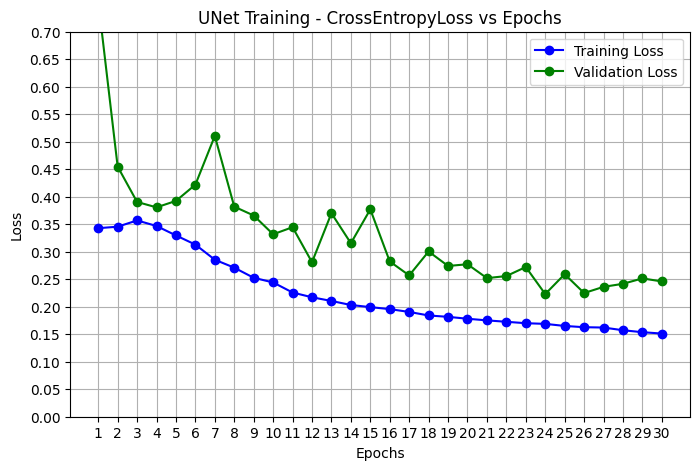

In [10]:
#Training
import os
import torch
import torch.nn.functional as F
import torchvision
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

# Device
DEVICE = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)

# Hyperparameters
BATCH_SIZE = 4
NUM_WORKERS = os.cpu_count() - 1  # 4
NUM_EPOCHS = 30
PATIENCE = 10
LEARNING_RATE =  [1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
LEARNING_RATE = LEARNING_RATE[4]
# Number of classes
NUM_CLASSES = 1
# Model parameters
#CHANNELS = [3, 64, 128, 256]
OUT_CHANNELS = 1

#torchvision.disable_beta_transforms_warning() May need this if running certain torchvision version
#model = UNet(channels=CHANNELS, out_channels=OUT_CHANNELS)#
model = UNet(input_channels=3,num_classes=NUM_CLASSES).to(DEVICE)
model.to(DEVICE)



def train_step(
    model: torch.nn.Module,
    dataloader: torch.utils.data.DataLoader,
    loss_fn: torch.nn.Module,
    optimizer: torch.optim.Optimizer,
    model_path:str
) -> Tuple[float, float]:

    """Trains a PyTorch model for a single epoch.

    Turns a target PyTorch model to training mode and then
    runs through all of the required training steps (forward
    pass, loss calculation, optimizer step).

    """
    # set model to training mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0

    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X = X.to(DEVICE)
        y = y.to(DEVICE)


        # Add a batch dimension if it's missing for X
        if X.dim() == 3:
            X = X.unsqueeze(0) # Add unsqueeze here for X

        if y.dim() == 3:
            y = y.unsqueeze(0) # Add unsqueeze here for X

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metric across all batches
        train_acc += accuracy(y_pred, y).item()
    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc


def val_step(
    model: torch.nn.Module,
    dataloader: torch.utils.data.DataLoader,
    loss_fn: torch.nn.Module,
) -> Tuple[float, float]:
    """Tests a PyTorch model for a single epoch.

    Turns a target PyTorch model to "eval" mode and then performs
    a forward pass on a testing dataset.

    """
    # set model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    val_loss, val_acc = 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X = X.to(DEVICE)
            y = y.to(DEVICE)

            # Add a batch dimension if it's missing for X and y
            if X.dim() == 3:
                X = X.unsqueeze(0)  # Add unsqueeze here for X
            if y.dim() == 3:
                y = y.unsqueeze(0)  # Add unsqueeze here for y

            # 1. Forward pass
            val_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(val_pred_logits, y)
            val_loss += loss.item()

            # Calculate and accumulate accuracy
            val_acc += accuracy(val_pred_logits, y).item()

    # Adjust metrics to get average loss and accuracy per batch
    val_loss = val_loss / len(dataloader)
    val_acc = val_acc / len(dataloader)
    return val_loss, val_acc


def train(
    model: torch.nn.Module,
    train_dataloader: torch.utils.data.DataLoader,
    val_dataloader: torch.utils.data.DataLoader,
    optimizer: torch.optim.Optimizer,
    loss_fn: torch.nn.Module,
    epochs: int,
    model_path: str,
) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and val_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    """
    # Create empty results dictionary
    results = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

    # Loop through training and testing steps for a number of epochs
    for epoch in range(epochs):
        train_loss, train_acc = train_step(
            model=model,
            dataloader=train_dataloader,
            loss_fn=loss_fn,
            optimizer=optimizer,
            model_path=model_path)

        val_loss, val_acc = val_step(
            model=model, dataloader=val_dataloader, loss_fn=loss_fn
        )

        # Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"val_loss: {val_loss:.4f} | "
            f"val_acc: {val_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["val_loss"].append(val_loss)
        results["val_acc"].append(val_acc)

    # Return the filled results at the end of the epochs
    torch.save(model.state_dict(), model_path)
    print(f"Saved model to { model_path}")
    return results


loss_fn = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
results = train(
        model=model,
        train_dataloader=mars_train_dataset,
        val_dataloader=mars_val_dataset,
        optimizer=optimizer,
        loss_fn=loss_fn,
        epochs=NUM_EPOCHS,
        model_path=mars_model_pth
    )


#The training & loss graph has been replotted with better range for visualixation
train_losses = results["train_loss"]
val_losses = results["val_loss"]

# Plot training loss
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(train_losses) + 1), train_losses, marker='o', linestyle='-', color='b', label="Training Loss")
plt.plot(range(1, len(val_losses) + 1), val_losses, marker='o', linestyle='-', color='g', label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("UNet Training - CrossEntropyLoss vs Epochs")
plt.ylim(0, max(train_losses))
plt.yticks(np.arange(0, max(train_losses)*2, 0.05))  # Set y-axis ticks at 0.05 intervals
plt.xticks(range(1, len(val_losses) + 1))
plt.legend()
plt.grid(True)
plt.show()


### SECTION 11 - Performance Against Test Set

In [11]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
# Model parameters
CHANNELS = [3, 64, 128, 256]
NUM_CLASSES = 1
# Device
DEVICE = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)

# Define model explicitly
model_for_inference = UNet(input_channels=3,num_classes=NUM_CLASSES).to(DEVICE)

# Load state_dict explicitly to correct model
checkpoint = torch.load(mars_model_pth, map_location=DEVICE)
model_for_inference.load_state_dict(checkpoint)

# Switch to evaluation mode
model_for_inference.eval()

# Resize dimensions
INPUT_HEIGHT = 256
INPUT_WIDTH = 256


test_acc = 0.0
num_batches = 0

test_size = 50 #test size
counter = 0
# Loop through the DataLoader
for img_tensor, mask_tensor in mars_test_dataset:  # test_loader is your DataLoader for mars_test_dataset
    img_tensor = img_tensor.to(DEVICE).unsqueeze(0)
    mask_tensor = mask_tensor.to(DEVICE)

    image_transform = transforms.Compose([
                transforms.Resize((INPUT_HEIGHT,INPUT_WIDTH)),
                transforms.ToTensor()
    ])

    with torch.no_grad():
        outputs = model(img_tensor)
        acc = accuracy(outputs, mask_tensor)
        test_acc += acc.item()

    counter = counter + 1
    if counter>=test_size:
            break

# Final test accuracy
avg_test_acc = test_acc / counter
print(f"Test Set Accuracy: {avg_test_acc:.4f}")

Test Set Accuracy: 0.8995


## SECTION 12 - Inference

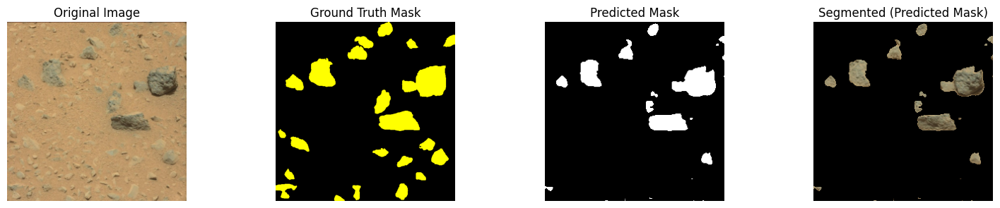

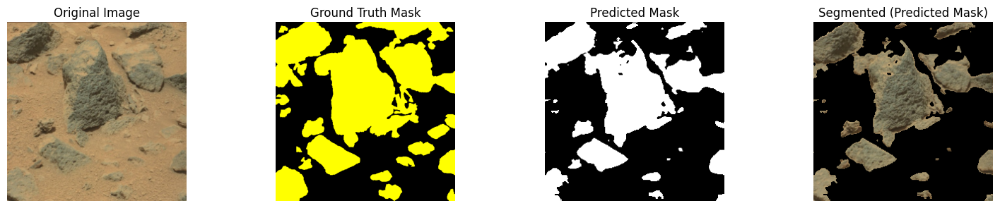

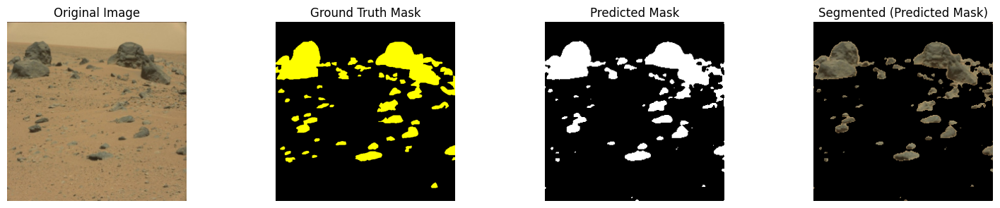

In [12]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.transforms import Grayscale
from PIL import Image as im
# Number of classes
NUM_CLASSES = 1
# Device
DEVICE = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
model.to(DEVICE)
# Init model
model_for_inference = UNet(input_channels=3,num_classes=NUM_CLASSES).to(DEVICE)
model_for_inference.eval() # mdel in eval mode

# load checkpoint correctly
checkpoint = torch.load(mars_model_pth, map_location=DEVICE)
model_for_inference.load_state_dict(checkpoint)

# Resize dimensions
INPUT_HEIGHT = 256
INPUT_WIDTH = 256

target = 255                   # The single channel target grayscale value to segment
non_target = 0                 # The black value (for empty pixels)

image_transform = transforms.Compose([
            transforms.Resize((INPUT_HEIGHT,INPUT_WIDTH)),
            transforms.ToTensor()
])

#Given these sample test files
mars_test_dataset_imgs = ["/content/drive/MyDrive/ECE551/Mars/MarsData/img_raw/test/332_0332ML0013430000107963E01_DXXX_raw.png",
                      "/content/drive/MyDrive/ECE551/Mars/MarsData/img_raw/test/336_0336MR0013580000301061E02_DXXX_raw.png",
                      "/content/drive/MyDrive/ECE551/Mars/MarsData/img_raw/test/349_0349ML0014190010108330E01_DXXX_raw.png"]

mars_test_dataset_masks =["/content/drive/MyDrive/ECE551/Mars/MarsData/mask/test/332_0332ML0013430000107963E01_DXXX_raw.png",
                      "/content/drive/MyDrive/ECE551/Mars/MarsData/mask/test/336_0336MR0013580000301061E02_DXXX_raw.png",
                      "/content/drive/MyDrive/ECE551/Mars/MarsData/mask/test/349_0349ML0014190010108330E01_DXXX_raw.png"]


# Loop through DataLoader
for (img_path,masks_path) in zip(mars_test_dataset_imgs,mars_test_dataset_masks):

    image = Image.open(img_path)
    masks = Image.open(masks_path)

    # transform image
    img_tensor = image_transform(image)

    # add batch dimension. Because it expects 4D tensor
    img_tensor = img_tensor.unsqueeze(0)

    # Convert tensors to NumPy arrays for visualization
    img_np = img_tensor.squeeze().cpu().permute(1, 2, 0).numpy() * 255  # [C,H,W] -> [H,W,C], denormalize
    img_np = img_np.astype(np.uint8)

    #PREDICION -start
    model.eval()
    with torch.no_grad():
        prediction = model(img_tensor.to(DEVICE))
        # save prediction
        prediction = torch.sigmoid(prediction)
        prediction = prediction[0].cpu().numpy() # taking the 1st patch since it consists of batch of 1, (1, 512, 512)
        prediction = np.squeeze(prediction, axis=0) # from 3d to 2d (512, 512)
        prediction = (prediction > 0.5).astype(np.uint8) #threshhold
        prediction = np.clip(prediction* 255, 0, 255).astype(np.uint8) #quantize
        # prediction = cv2.bitwise_not(prediction)
        # DEBUGGING print("min:",min(prediction.flatten()),"max:",max(prediction.flatten()))
        prediction = Image.fromarray(prediction)
    #PREDICION - end

    #Segmentation - start
    segmented_image_only = np.zeros_like(img_np)  # Initialized to black (non_target)
    pred_np = np.array(prediction)
    segment_coordinates = [
        (y, x)
        for y in range(pred_np.shape[0])
        for x in range(pred_np.shape[1])
        if pred_np[y, x] == target
    ]
    for y, x in segment_coordinates:
        segmented_image_only[y, x] = img_np[y, x]
    #Segmentation - end

    #POST PROCESS - start
    #Define the lower and upper bounds for white color in BGR
    post_processed = prediction.copy()
    post_processed = filter_white_blobs_by_area(np.array(post_processed),20,None,True)
     # Reshape the array into a
    # familiar resoluition
    post_processed = Image.fromarray(post_processed)
    #POST PROCESS - end

    #Optional - Segmentation using post procssed - start
    # post_segmented_image_only = np.zeros_like(img_np)  # Initialized to black (non_target)
    # post_pred_np = np.array(post_processed)
    # segment_coordinates = [
    # (y, x)
    # for y in range(post_pred_np.shape[0])
    # for x in range(post_pred_np.shape[1])
    # if np.any(post_pred_np[y, x] == target)  # Use np.any() to check if any RGB value matches target
    # ]
    # for y, x in segment_coordinates:
    #     post_segmented_image_only[y, x] = img_np[y, x]
    #Segmentation using post procssed - end

    #plot - start
    fig, axs = plt.subplots(1, 4, figsize=(18, 5))

    axs[0].imshow(img_np)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(masks, cmap='gray')
    axs[1].set_title("Ground Truth Mask")
    axs[1].axis("off")

    axs[2].imshow(prediction, cmap='gray')
    axs[2].set_title("Predicted Mask")
    axs[2].axis("off")

    axs[3].imshow(segmented_image_only)
    axs[3].set_title("Segmented (Predicted Mask)")
    axs[3].axis("off")

    # Optional
    # axs[4].imshow(post_processed, cmap='gray')
    # axs[4].set_title("Post Processed")
    # axs[4].axis("off")

    # axs[5].imshow(post_segmented_image_only)
    # axs[5].set_title("Segmented (Processed Mask)")
    # axs[5].axis("off")

    #1 inch space between subplots
    plt.subplots_adjust(wspace=0.5)
    #plot -end
